<a href="https://colab.research.google.com/github/smirnovaanastasia1234/MOMO_II_Homework/blob/main/MOMO_II_Homework_II_Customer_Churn_Prediction_Part_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **МОМО II_Homework II_Customer Churn Prediction_Part 1**

Набор обучающих данных содержит 4250 выборок. Каждый образец содержит 19 функций и 1 логическую переменную «churn», которая указывает класс образца. 19 входных функций и 1 целевая переменная:


1.   "state" строка . 2-буквенный код штата США, где проживает клиент
2.   "account_length", numerical. Number of months the customer has been with the current telco provider
3. "area_code", string="area_code_AAA" where AAA = 3 digit area code
4. "international_plan", (yes/no). The customer has international plan.
5. "voice_mail_plan", (yes/no). The customer has voice mail plan.
6. "number_vmail_messages", numerical. Number of voice-mail messages.
7. "total_day_minutes", numerical. Total minutes of day calls.
8. "total_day_calls", numerical. Total minutes of day calls.
9. "total_day_charge", numerical. Total charge of day calls.
10. "total_eve_minutes", numerical. Total minutes of evening calls.
11. "total_eve_calls", numerical. Total number of evening calls.
12. "total_eve_charge", numerical. Total charge of evening calls.
13. "total_night_minutes", numerical. Total minutes of night calls.
14. "total_night_calls", numerical. Total number of night calls.
15. "total_night_charge", numerical. Total charge of night calls.
16. "total_intl_minutes", numerical. Total minutes of international calls.
17. "total_intl_calls", numerical. Total number of international calls.
18. "total_intl_charge", numerical. Total charge of international calls
19. "number_customer_service_calls", numerical. Number of calls to customer service
20. "churn", (yes/no). Customer churn - target variable.




# **Import библиотек**

In [463]:
import pandas as pd
import plotly as plt
import plotly.express as px
from google.colab import files 

import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler


from sklearn.metrics import classification_report
from sklearn.model_selection import StratifiedKFold

from sklearn.metrics import confusion_matrix

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import r2_score

from sklearn.model_selection import train_test_split
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_validate
from google.colab import files # чтобы загружать файлы в облако через проводник 

# Модель
from sklearn.linear_model import LogisticRegression  # Логистичекая регрессия от scikit-learn
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn import preprocessing as prep 
from sklearn.impute import SimpleImputer
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import auc, roc_auc_score, roc_curve
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, StandardScaler, RobustScaler, LabelEncoder
from sklearn.cluster import SpectralClustering
from sklearn.neighbors import  KNeighborsClassifier 
from sklearn.model_selection import RandomizedSearchCV

from sklearn.model_selection import GridSearchCV

from sklearn.metrics import make_scorer 
from sklearn.model_selection import ShuffleSplit 
from sklearn.model_selection import cross_val_score 
from sklearn import set_config
     

In [464]:
sns.set_style('darkgrid')

In [465]:
uploaded = files.upload() #просто запускаем и выбираем файл  API токена в проводнике

#↓ строка которая активирует наш API токен
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json


# **Загружаем Данные**

In [466]:
!kaggle competitions download -c customer-churn-prediction-2020

customer-churn-prediction-2020.zip: Skipping, found more recently modified local copy (use --force to force download)


In [467]:
!unzip customer-churn-prediction-2020.zip

Archive:  customer-churn-prediction-2020.zip
replace sampleSubmission.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: sampleSubmission.csv    
replace test.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: all
error:  invalid response [all]
replace test.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: all
error:  invalid response [all]
replace test.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: test.csv                
replace train.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: train.csv               


# **Загружаем данные в Pandas**

In [468]:
df = pd.read_csv('train.csv')
df

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
1,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
2,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no
3,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no
4,MA,121,area_code_510,no,yes,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4245,MT,83,area_code_415,no,no,0,188.3,70,32.01,243.8,88,20.72,213.7,79,9.62,10.3,6,2.78,0,no
4246,WV,73,area_code_408,no,no,0,177.9,89,30.24,131.2,82,11.15,186.2,89,8.38,11.5,6,3.11,3,no
4247,NC,75,area_code_408,no,no,0,170.7,101,29.02,193.1,126,16.41,129.1,104,5.81,6.9,7,1.86,1,no
4248,HI,50,area_code_408,no,yes,40,235.7,127,40.07,223.0,126,18.96,297.5,116,13.39,9.9,5,2.67,2,no


# Информация о DataFrame

In [469]:
df.info() # информация о данных в датафрейме

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4250 entries, 0 to 4249
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          4250 non-null   object 
 1   account_length                 4250 non-null   int64  
 2   area_code                      4250 non-null   object 
 3   international_plan             4250 non-null   object 
 4   voice_mail_plan                4250 non-null   object 
 5   number_vmail_messages          4250 non-null   int64  
 6   total_day_minutes              4250 non-null   float64
 7   total_day_calls                4250 non-null   int64  
 8   total_day_charge               4250 non-null   float64
 9   total_eve_minutes              4250 non-null   float64
 10  total_eve_calls                4250 non-null   int64  
 11  total_eve_charge               4250 non-null   float64
 12  total_night_minutes            4250 non-null   f

# Поиск Дубликатов

In [470]:
df.duplicated().sum() ##Просуммируем и узнаем сколько всего дубликатов 

0

Дубликаты не обнаруженны

# EDA - Разведывательный анализ данных.

In [471]:
# определим категориальные и численные столбцы
cat_columns = []
num_columns = []

for column_name in df.columns:
    if (df[column_name].dtypes == object):
        cat_columns +=[column_name]
    else:
        num_columns +=[column_name]

print('Категориальные данные:\t ',cat_columns, '\n Число столблцов = ',len(cat_columns))

print('Числовые данные:\t ',  num_columns, '\n Число столблцов = ',len(num_columns))

Категориальные данные:	  ['state', 'area_code', 'international_plan', 'voice_mail_plan', 'churn'] 
 Число столблцов =  5
Числовые данные:	  ['account_length', 'number_vmail_messages', 'total_day_minutes', 'total_day_calls', 'total_day_charge', 'total_eve_minutes', 'total_eve_calls', 'total_eve_charge', 'total_night_minutes', 'total_night_calls', 'total_night_charge', 'total_intl_minutes', 'total_intl_calls', 'total_intl_charge', 'number_customer_service_calls'] 
 Число столблцов =  15


## Анализ числовых признаков

In [472]:
df.describe() # выводим информацию о числовых столбцах

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
count,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000
mean,100.236235,7.631765,180.259600,99.907294,30.644682,200.173906,100.176471,17.015012,200.527882,99.839529,9.023892,10.256071,4.426353,2.769654,1.559059
std,39.698401,13.439882,54.012373,19.850817,9.182096,50.249518,19.908591,4.271212,50.353548,20.093220,2.265922,2.760102,2.463069,0.745204,1.311434
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,73.000000,0.000000,143.325000,87.000000,24.365000,165.925000,87.000000,14.102500,167.225000,86.000000,7.522500,8.500000,3.000000,2.300000,1.000000
50%,100.000000,0.000000,180.450000,100.000000,30.680000,200.700000,100.000000,17.060000,200.450000,100.000000,9.020000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,16.000000,216.200000,113.000000,36.750000,233.775000,114.000000,19.867500,234.700000,113.000000,10.560000,12.000000,6.000000,3.240000,2.000000
max,243.000000,52.000000,351.500000,165.000000,59.760000,359.300000,170.000000,30.540000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


рассмотрим гистограммы (распределение) значений по каждому числовому признаку (столбцу)



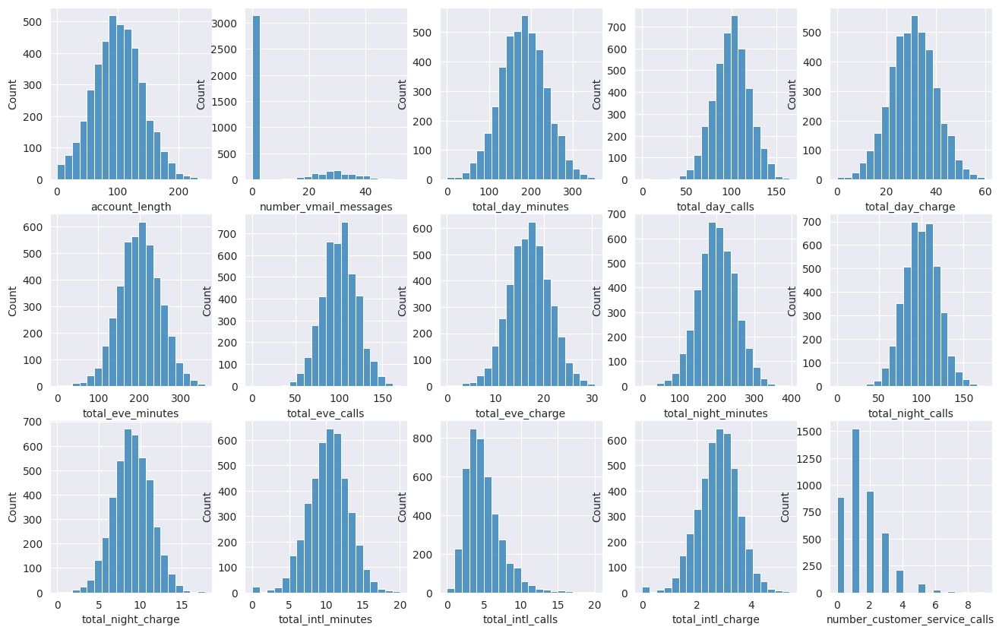

In [473]:
width =5
height = int(np.ceil(len(num_columns)/width))
fig, ax = plt.subplots(nrows=height, ncols=width, figsize=(16,10)) # создаем "полотно", на котором будем "рисовать" графики
#     ↑  более точная структура (почти синоним subplot). Говорим что у нас будет height строк и width столбцов

for idx, column_name in enumerate(num_columns): # перебираем все числовые данные 
    plt.subplot(height,width, idx+1) #берем конкретную ячейку из заранее подготовленную заготовку
    # рисуем с помощью библиотеки seaborn
    sns.histplot(data=df, # какой датафрейм используем 
            x=column_name, # какую переменную отрисовываем
            bins = 20);  # на сколько ячеек разбиваем 

В основном данные распределены нормально

Определим зависимости параметров друг от друга

### Корреляция числовых признаков 

In [474]:
cm = sns.color_palette("vlag", as_cmap=True) # создадим цветовой стиль, чтобы раскрасить табличку

df.corr().style.background_gradient(cmap=cm, # наш цветовой стиль
                                    vmin = -1, # указываем нижний диапазон
                                    vmax=1) # указываем верхний  диапазон

<ipython-input-474-b6242bc97fb5>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr().style.background_gradient(cmap=cm, # наш цветовой стиль


,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
account_length,1.000000,-0.006626,-0.001612,0.023002,-0.001613,-0.010326,0.005535,-0.010322,-0.009916,-0.001846,-0.009942,0.004539,0.013690,0.004494,0.001002
number_vmail_messages,-0.006626,1.000000,0.002000,-0.006920,0.001994,0.010725,0.003593,0.010736,0.018308,0.001977,0.018300,0.005220,0.006585,0.005249,-0.015303
total_day_minutes,-0.001612,0.002000,1.000000,0.000747,1.000000,-0.013248,0.005986,-0.013258,0.010049,-0.004812,0.010036,-0.021369,0.003859,-0.021291,-0.002925
total_day_calls,0.023002,-0.006920,0.000747,1.000000,0.000751,0.008661,0.003739,0.008663,0.002206,-0.004815,0.002200,0.008834,0.009377,0.008909,-0.015845
total_day_charge,-0.001613,0.001994,1.000000,0.000751,1.000000,-0.013247,0.005985,-0.013257,0.010053,-0.004816,0.010040,-0.021374,0.003853,-0.021296,-0.002932
total_eve_minutes,-0.010326,0.010725,-0.013248,0.008661,-0.013247,1.000000,0.003101,1.000000,-0.014018,0.011973,-0.014031,-0.003509,0.012239,-0.003460,-0.010063
total_eve_calls,0.005535,0.003593,0.005986,0.003739,0.005985,0.003101,1.000000,0.003120,0.008425,-0.011929,0.008441,-0.013096,0.004949,-0.013145,0.006956
total_eve_charge,-0.010322,0.010736,-0.013258,0.008663,-0.013257,1.000000,0.003120,1.000000,-0.014022,0.011971,-0.014035,-0.003512,0.012239,-0.003463,-0.010071
total_night_minutes,-0.009916,0.018308,0.010049,0.002206,0.010053,-0.014018,0.008425,-0.014022,1.000000,0.023815,0.999999,-0.000113,-0.024280,-0.000047,-0.013771
total_night_calls,-0.001846,0.001977,-0.004812,-0.004815,-0.004816,0.011973,-0.011929,0.011971,0.023815,1.000000,0.023798,0.001093,0.003851,0.001054,-0.008893


<Figure size 1500x3000 with 0 Axes>

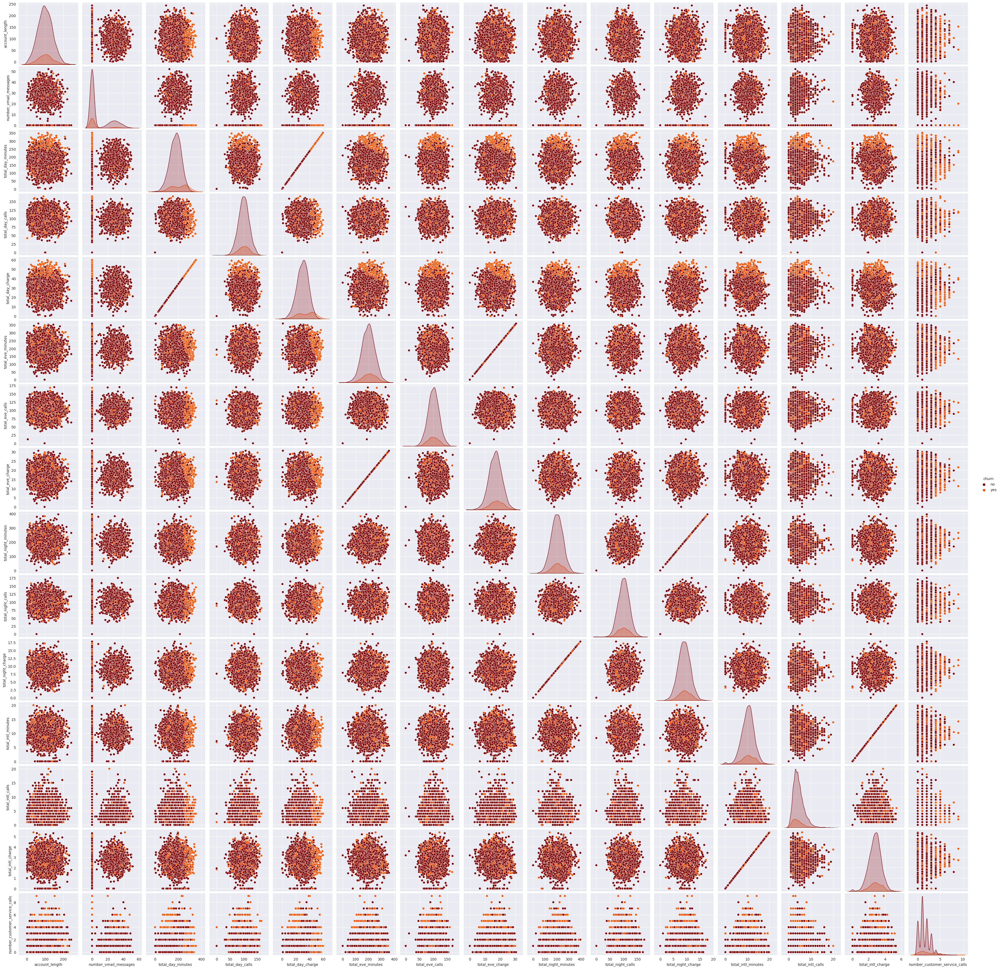

In [475]:
# построим  график зависимости показателей друг от друга
fig = plt.figure(figsize=(15,30))
sns.pairplot(data = df, 
             hue ='churn',
             palette = 'gist_heat');

Высокая степень корреляции признаков : total_day_charge и total_day_minutes, total_eve_charge и total_eve_minutes, total_night_charge и total_night_minutes , total_intl_charge и total_intl_minutes

## Категориальные данные

посмотрим на число повторений результата в каждом категориальном признаке

метод `.nunique()`

In [476]:
df[cat_columns].nunique()   

state                 51
area_code              3
international_plan     2
voice_mail_plan        2
churn                  2
dtype: int64

In [477]:
counts = df.state.value_counts() # сначала посмотрим на столбец State

counts  # опять Серия. 
        #В роли Индексов - уникальное значение столбца
        #В роли значений  - сколько раз это значение встречается

WV    139
MN    108
ID    106
AL    101
VA    100
OR     99
TX     98
UT     97
NY     96
NJ     96
WY     95
OH     95
WI     94
MA     89
ME     89
CT     88
RI     87
MI     87
KS     87
MD     86
VT     86
KY     85
NV     83
IN     83
MS     82
WA     80
NC     80
MO     80
DE     80
CO     80
MT     80
IL     79
TN     79
NM     78
OK     78
NH     78
HI     77
AZ     77
FL     76
SD     75
NE     73
DC     72
SC     72
AR     71
LA     69
PA     67
ND     67
GA     64
IA     62
AK     61
CA     39
Name: state, dtype: int64

In [478]:
counts = df.area_code.value_counts()
counts

area_code_415    2108
area_code_408    1086
area_code_510    1056
Name: area_code, dtype: int64

In [479]:
counts = df.international_plan.value_counts()
counts

no     3854
yes     396
Name: international_plan, dtype: int64

In [480]:
counts = df.voice_mail_plan.value_counts()
counts

no     3138
yes    1112
Name: voice_mail_plan, dtype: int64

In [481]:
counts = df.churn.value_counts()
counts

no     3652
yes     598
Name: churn, dtype: int64

## Добавление в модель дополнительных признаков на основе имеющихся

Рассчитаем стоимость минуты дневного звонка

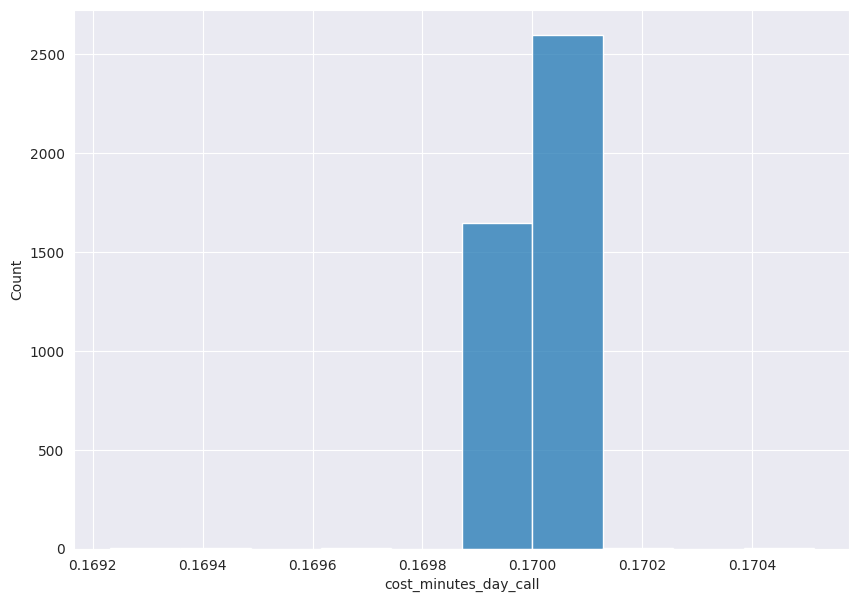

In [482]:
df['cost_minutes_day_call'] = df.total_day_charge/df.total_day_minutes # делим один столбец на другой

# визуализируем результат
plt.figure(figsize=(10,7))
sns.histplot(data=df,
            x='cost_minutes_day_call', bins = 10);

In [483]:
# рассчитаем среднюю стоимость минуты дневного звонка в зависимости от area_code и добавим в отдельный столбец
df['mean_cost_minutes_day_call_by_area_code'] = df.groupby(['area_code'])['cost_minutes_day_call'].transform('mean')

df


,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,...,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn,cost_minutes_day_call,mean_cost_minutes_day_call_by_area_code
0,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,...,254.4,103,11.45,13.7,3,3.70,1,no,0.169988,0.170004
1,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,...,162.6,104,7.32,12.2,5,3.29,0,no,0.170008,0.170004
2,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,...,196.9,89,8.86,6.6,7,1.78,2,no,0.170007,0.170003
3,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,...,186.9,121,8.41,10.1,3,2.73,3,no,0.170006,0.170004
4,MA,121,area_code_510,no,yes,24,218.2,88,37.09,348.5,...,212.6,118,9.57,7.5,7,2.03,3,no,0.169982,0.170002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4245,MT,83,area_code_415,no,no,0,188.3,70,32.01,243.8,...,213.7,79,9.62,10.3,6,2.78,0,no,0.169995,0.170004
4246,WV,73,area_code_408,no,no,0,177.9,89,30.24,131.2,...,186.2,89,8.38,11.5,6,3.11,3,no,0.169983,0.170003
4247,NC,75,area_code_408,no,no,0,170.7,101,29.02,193.1,...,129.1,104,5.81,6.9,7,1.86,1,no,0.170006,0.170003
4248,HI,50,area_code_408,no,yes,40,235.7,127,40.07,223.0,...,297.5,116,13.39,9.9,5,2.67,2,no,0.170004,0.170003


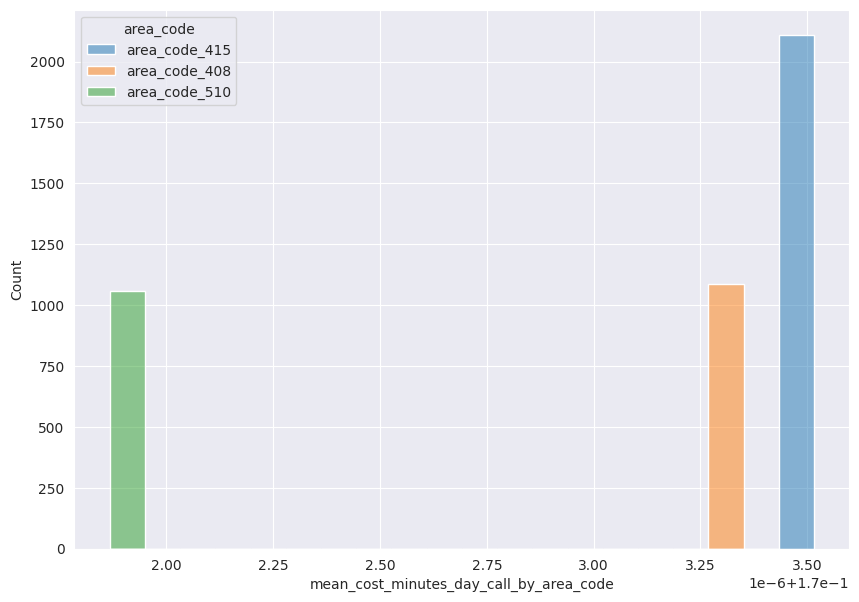

In [484]:
# посмотроим график нового параметра
plt.figure(figsize=(10,7))
sns.histplot(data=df,
            x='mean_cost_minutes_day_call_by_area_code',hue='area_code' ,bins = 20);

Самая низкая средняя стоимость минуты дневного звонка в area_code_510

Рассчитаем стоимость минуты вечернего звонка

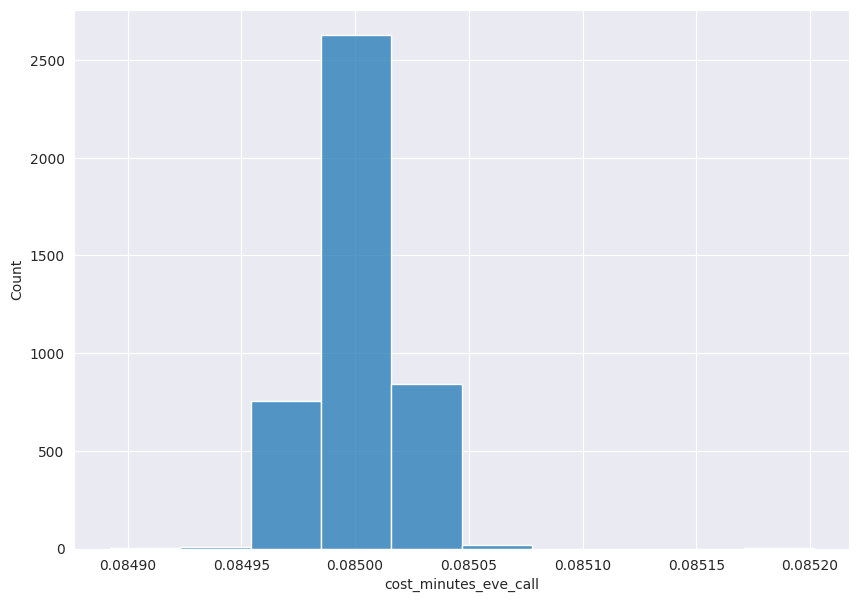

In [485]:
df['cost_minutes_eve_call'] = df.total_eve_charge/df.total_eve_minutes # делим один столбец на другой

# визуализируем результат
plt.figure(figsize=(10,7))
sns.histplot(data=df,
            x='cost_minutes_eve_call', bins = 10);

In [486]:
# рассчитаем среднюю стоимость минуты вечернего звонка в зависимости от area_code и добавим в отдельный столбец
df['mean_cost_minutes_eve_call_by_area_code'] = df.groupby(['area_code'])['cost_minutes_eve_call'].transform('mean')

df


,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,...,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn,cost_minutes_day_call,mean_cost_minutes_day_call_by_area_code,cost_minutes_eve_call,mean_cost_minutes_eve_call_by_area_code
0,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,...,11.45,13.7,3,3.70,1,no,0.169988,0.170004,0.085013,0.085001
1,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,...,7.32,12.2,5,3.29,0,no,0.170008,0.170004,0.084983,0.085001
2,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,...,8.86,6.6,7,1.78,2,no,0.170007,0.170003,0.084976,0.085001
3,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,...,8.41,10.1,3,2.73,3,no,0.170006,0.170004,0.085030,0.085001
4,MA,121,area_code_510,no,yes,24,218.2,88,37.09,348.5,...,9.57,7.5,7,2.03,3,no,0.169982,0.170002,0.084993,0.085002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4245,MT,83,area_code_415,no,no,0,188.3,70,32.01,243.8,...,9.62,10.3,6,2.78,0,no,0.169995,0.170004,0.084988,0.085001
4246,WV,73,area_code_408,no,no,0,177.9,89,30.24,131.2,...,8.38,11.5,6,3.11,3,no,0.169983,0.170003,0.084985,0.085001
4247,NC,75,area_code_408,no,no,0,170.7,101,29.02,193.1,...,5.81,6.9,7,1.86,1,no,0.170006,0.170003,0.084982,0.085001
4248,HI,50,area_code_408,no,yes,40,235.7,127,40.07,223.0,...,13.39,9.9,5,2.67,2,no,0.170004,0.170003,0.085022,0.085001


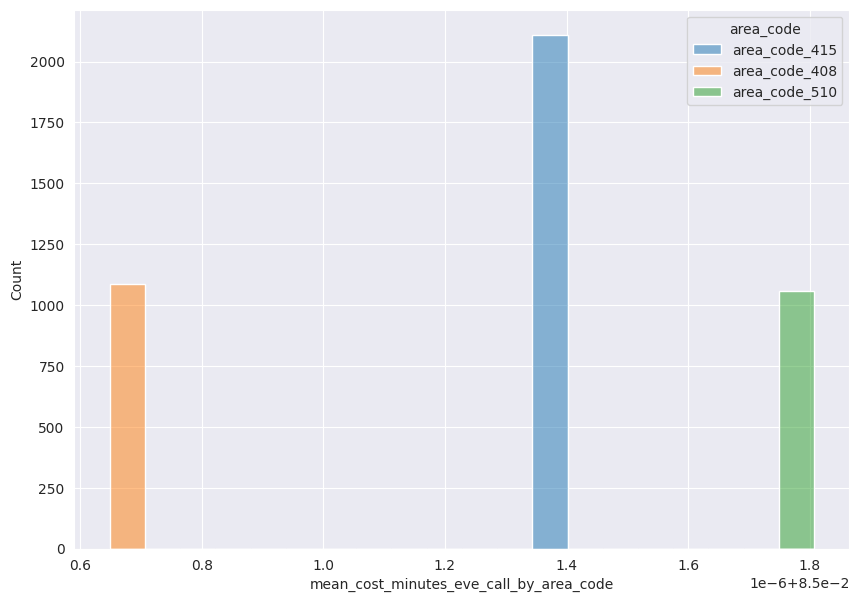

In [487]:
# посмотроим график нового параметра
plt.figure(figsize=(10,7))
sns.histplot(data=df,
            x='mean_cost_minutes_eve_call_by_area_code',hue='area_code' ,bins = 20);

Самая низкая средняя стоимость минуты вечернего звонка в area_code_408

Рассчитаем стоимость минуты ночного звонка

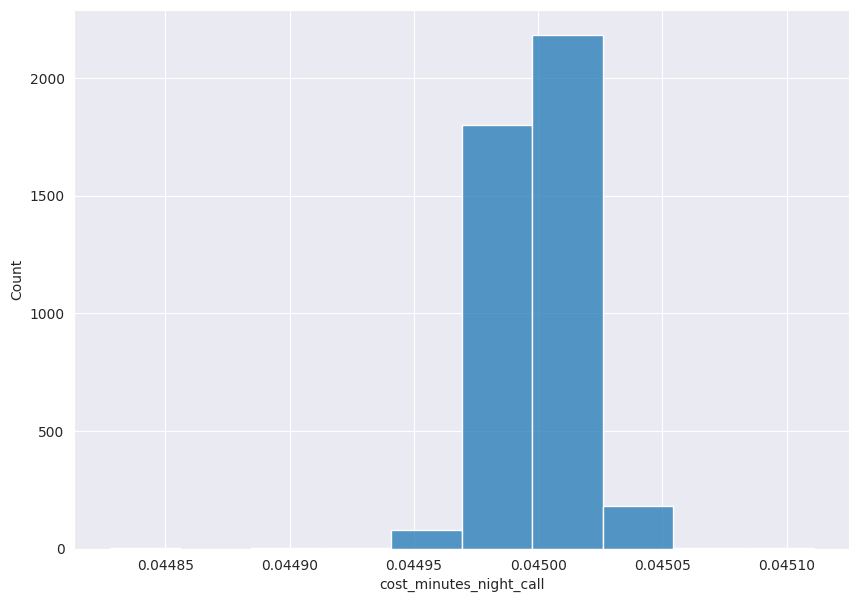

In [488]:
df['cost_minutes_night_call'] = df.total_night_charge/df.total_night_minutes # делим один столбец на другой

# визуализируем результат
plt.figure(figsize=(10,7))
sns.histplot(data=df,
            x='cost_minutes_night_call', bins = 10);

In [489]:
# рассчитаем среднюю стоимость минуты ночного звонка в зависимости от area_code и добавим в отдельный столбец
df['mean_cost_minutes_night_call_by_area_code'] = df.groupby(['area_code'])['cost_minutes_night_call'].transform('mean')

df

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,...,total_intl_calls,total_intl_charge,number_customer_service_calls,churn,cost_minutes_day_call,mean_cost_minutes_day_call_by_area_code,cost_minutes_eve_call,mean_cost_minutes_eve_call_by_area_code,cost_minutes_night_call,mean_cost_minutes_night_call_by_area_code
0,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,...,3,3.70,1,no,0.169988,0.170004,0.085013,0.085001,0.045008,0.045001
1,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,...,5,3.29,0,no,0.170008,0.170004,0.084983,0.085001,0.045018,0.045001
2,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,...,7,1.78,2,no,0.170007,0.170003,0.084976,0.085001,0.044997,0.045001
3,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,...,3,2.73,3,no,0.170006,0.170004,0.085030,0.085001,0.044997,0.045001
4,MA,121,area_code_510,no,yes,24,218.2,88,37.09,348.5,...,7,2.03,3,no,0.169982,0.170002,0.084993,0.085002,0.045014,0.045000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4245,MT,83,area_code_415,no,no,0,188.3,70,32.01,243.8,...,6,2.78,0,no,0.169995,0.170004,0.084988,0.085001,0.045016,0.045001
4246,WV,73,area_code_408,no,no,0,177.9,89,30.24,131.2,...,6,3.11,3,no,0.169983,0.170003,0.084985,0.085001,0.045005,0.045001
4247,NC,75,area_code_408,no,no,0,170.7,101,29.02,193.1,...,7,1.86,1,no,0.170006,0.170003,0.084982,0.085001,0.045004,0.045001
4248,HI,50,area_code_408,no,yes,40,235.7,127,40.07,223.0,...,5,2.67,2,no,0.170004,0.170003,0.085022,0.085001,0.045008,0.045001


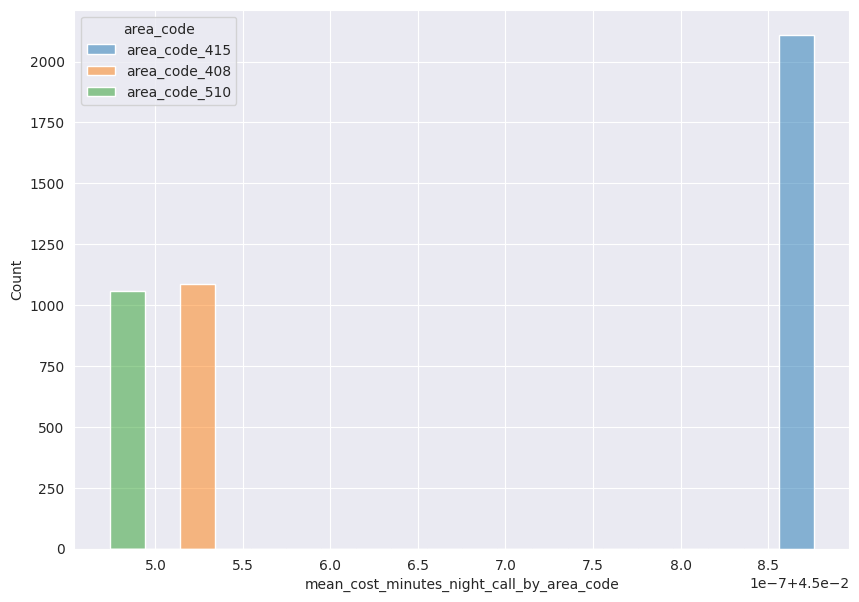

In [490]:
# посмотроим график нового параметра
plt.figure(figsize=(10,7))
sns.histplot(data=df,
            x='mean_cost_minutes_night_call_by_area_code',hue='area_code' ,bins = 20);

Самая низкая средняя стоимость минуты ночного звонка в area_code_510

Рассчитаем стоимость минуты международного звонка

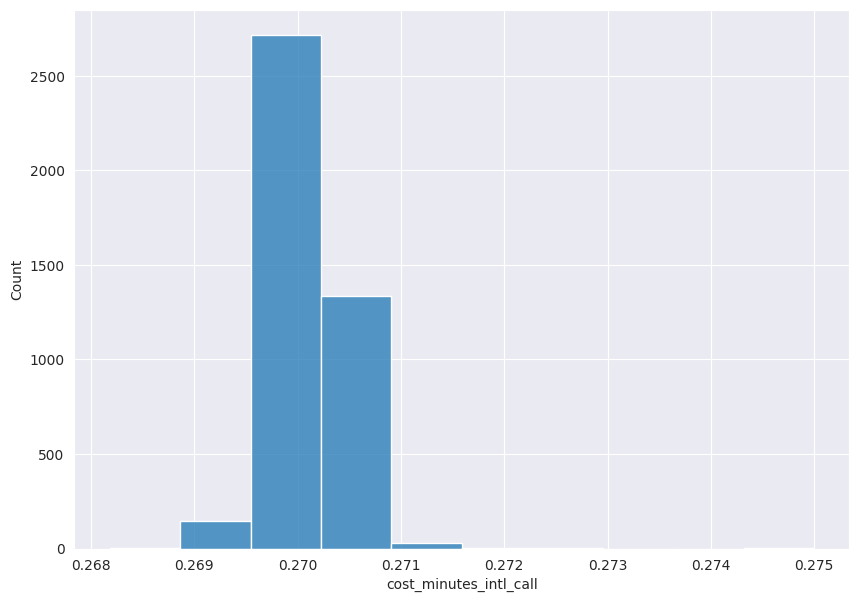

In [491]:
df['cost_minutes_intl_call'] = df.total_intl_charge/df.total_intl_minutes # делим один столбец на другой

# визуализируем результат
plt.figure(figsize=(10,7))
sns.histplot(data=df,
            x='cost_minutes_intl_call', bins = 10);

In [492]:
# рассчитаем среднюю стоимость минуты международного звонка в зависимости от area_code и добавим в отдельный столбец
df['mean_cost_minutes_intl_call_by_area_code'] = df.groupby(['area_code'])['cost_minutes_intl_call'].transform('mean')

df

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,...,number_customer_service_calls,churn,cost_minutes_day_call,mean_cost_minutes_day_call_by_area_code,cost_minutes_eve_call,mean_cost_minutes_eve_call_by_area_code,cost_minutes_night_call,mean_cost_minutes_night_call_by_area_code,cost_minutes_intl_call,mean_cost_minutes_intl_call_by_area_code
0,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,...,1,no,0.169988,0.170004,0.085013,0.085001,0.045008,0.045001,0.270073,0.270055
1,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,...,0,no,0.170008,0.170004,0.084983,0.085001,0.045018,0.045001,0.269672,0.270055
2,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,...,2,no,0.170007,0.170003,0.084976,0.085001,0.044997,0.045001,0.269697,0.270068
3,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,...,3,no,0.170006,0.170004,0.085030,0.085001,0.044997,0.045001,0.270297,0.270055
4,MA,121,area_code_510,no,yes,24,218.2,88,37.09,348.5,...,3,no,0.169982,0.170002,0.084993,0.085002,0.045014,0.045000,0.270667,0.270051
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4245,MT,83,area_code_415,no,no,0,188.3,70,32.01,243.8,...,0,no,0.169995,0.170004,0.084988,0.085001,0.045016,0.045001,0.269903,0.270055
4246,WV,73,area_code_408,no,no,0,177.9,89,30.24,131.2,...,3,no,0.169983,0.170003,0.084985,0.085001,0.045005,0.045001,0.270435,0.270068
4247,NC,75,area_code_408,no,no,0,170.7,101,29.02,193.1,...,1,no,0.170006,0.170003,0.084982,0.085001,0.045004,0.045001,0.269565,0.270068
4248,HI,50,area_code_408,no,yes,40,235.7,127,40.07,223.0,...,2,no,0.170004,0.170003,0.085022,0.085001,0.045008,0.045001,0.269697,0.270068


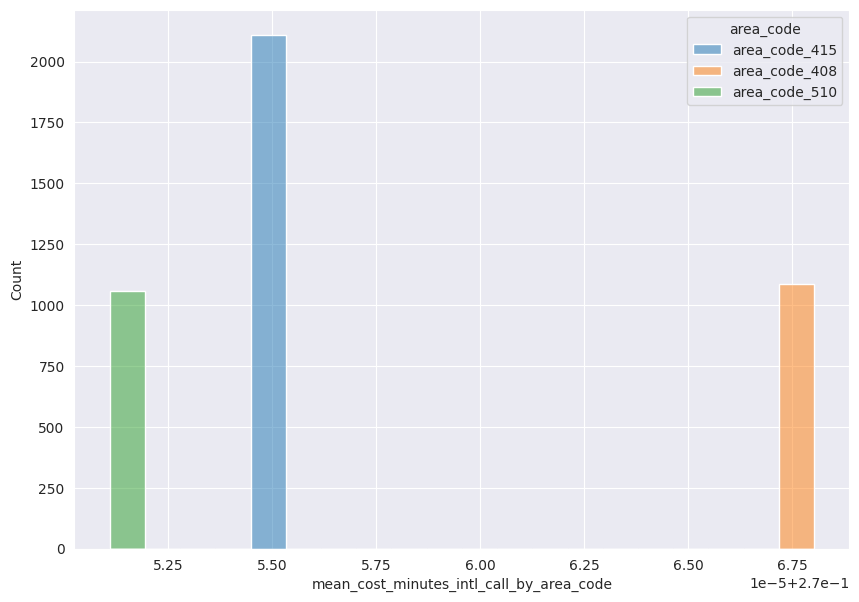

In [493]:
# посмотроим график нового параметра
plt.figure(figsize=(10,7))
sns.histplot(data=df,
            x='mean_cost_minutes_intl_call_by_area_code',hue='area_code' ,bins = 20);

Самая низкая средняя стоимость минуты междунарного звонка в area_code_510